**Import libraries**

In [ ]:
!pip install pandas-profiling==2.7.1
!pip install scikit-plot

import numpy as np
import pandas as pd
import seaborn as sns
import pandas_profiling
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
# Classifiers
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
# Folds
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
# Training methods
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_predict
# Metrics
from sklearn import metrics
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
# Plots
import matplotlib.pyplot as plt
import scikitplot as skplt
# Balance
from imblearn.under_sampling import NearMiss
from imblearn.over_sampling import RandomOverSampler
from imblearn.combine import SMOTETomek
from imblearn.ensemble import BalancedBaggingClassifier
# Download dataset
from google.colab import files

from collections import Counter

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)
/usr/local/lib/python3.6/dist-packages/

**Clean and Prepare Dataset**

In [ ]:
# Read dataset as Dataframe from Github
train_dataset = pd.read_csv("https://raw.githubusercontent.com/hernanChain/csvFiles/master/CreditDatasets/train_dataset.csv")
test_dataset = pd.read_csv("https://raw.githubusercontent.com/hernanChain/csvFiles/master/CreditDatasets/test_dataset.csv")

Show the head of Dataset, first 5 rows

In [ ]:
train_dataset.head()

,car_licence_plate,age,credit_card_provider,salary,has_criminal_records,company,number_of_credit_cards,application_date,years_in_current_job,credit_score,phone_number,number_of_children,is_married,name,email_domain,years_of_education,current_job,credit_card_expire,smoker,credit_card_number,address,application_id,defaulted_loan
0,HQK 648,33,JCB 16 digit,8424,False,"Soto, Smith and Heath",2,2013-07-23 09:29:24,14,670,1-980-158-4069x08826,2,False,Tiffany Moon,hotmail.com,12,"Education officer, museum",04/21,False,30450330820540,"0434 Cabrera Light Suite 778 Lake Jamietown, M...",QLTU2262744640839,False
1,YBE 134,30,VISA 13 digit,5742,False,Peterson PLC,2,2016-05-17 12:03:22,9,733,(331)020-4619,3,True,Pamela Gray,hotmail.com,14,Investment analyst,11/23,True,5323663567931781,"8721 Fuller Mountains West Scottberg, AR 95262...",CDIL5178457945771,False
2,ZPT-236,36,JCB 16 digit,7464,False,Hardy Inc,1,2014-06-11 04:54:52,12,834,(258)502-8172x096,3,False,Katherine Moore,yahoo.com,9,Conference centre manager,11/24,True,630466738303,"1040 Jennifer Plains Suite 933 Wolfeport, WY 8...",BSFW0171337501357,False
3,HCT-4243,29,VISA 16 digit,5506,False,Ball-Guzman,1,2015-09-23 12:55:52,11,676,+39(5)5222335031,3,False,Francisco Williams,yahoo.com,16,"Radiographer, diagnostic",10/23,True,869994096575273,"8780 Rojas Road Thompsonside, ID 92382-1485",OCXU9654389220595,False
4,IFU 236,33,VISA 13 digit,4657,False,Stark-Salazar,2,2014-06-17 15:56:51,15,764,(709)784-3501x151,3,True,Jonathan Hardy,yahoo.com,8,Art gallery manager,07/26,False,4968082233896281,"57881 Jacqueline Well Suite 366 Ginatown, VT 0...",JHAF3622120536541,False


In [ ]:
test_dataset.head()

,car_licence_plate,age,credit_card_provider,salary,has_criminal_records,company,number_of_credit_cards,application_date,years_in_current_job,credit_score,phone_number,number_of_children,is_married,name,email_domain,years_of_education,current_job,credit_card_expire,smoker,credit_card_number,address,application_id
0,EUT-761,23,Voyager,5498,False,Perez Inc,2,2016-09-26 07:17:15,17,633,1-210-016-6794,4,False,Jesus Martin,hotmail.com,13,"Surveyor, commercial/residential",08/21,True,3112285935182564,"07353 Isaiah Vista Melissaside, AK 95975-2668",RUWM2049266950699
1,539 KJU,26,Diners Club / Carte Blanche,6143,False,Cummings Inc,1,2014-06-17 08:41:32,10,1047,1-630-152-5816x59604,1,False,Donna Ramirez,yahoo.com,8,Musician,10/22,True,3112697271803548,"8067 Potter Stravenue Apt. 692 Port Victoria, ...",ABXL7467194767600
2,179 TFX,33,Diners Club / Carte Blanche,6016,True,"Smith, Cooper and Mooney",2,2015-07-22 08:31:20,14,668,1-138-114-8871x99944,3,True,Jeremy Jackson,gmail.com,11,Sports coach,10/27,False,30273085461496,"0309 Guerrero Ferry Apt. 219 North Kelseyberg,...",CMRX9833260333404
3,NGF-6456,27,JCB 16 digit,7415,False,Rich PLC,2,2015-02-26 21:20:12,9,559,(001)756-5936x6024,4,True,Maria Keller,yahoo.com,11,"Teacher, adult education",10/25,True,6011562283324591,"75258 Williams Vista Paulport, KY 62873",FXNE1359007341856
4,GYB 819,36,JCB 16 digit,6549,False,"Alvarez, Walls and Rodriguez",3,2015-12-16 10:10:21,9,975,139.136.5711x46667,2,True,Linda Long,hotmail.com,17,Press sub,11/26,False,5106371790381260,Unit 2668 Box 1868 DPO AE 47850,WHZG3090814216827


Show type of each variable

In [ ]:
print("Numero Filas y Columnas en dataset de entrenamiento = ",train_dataset.shape)
print("Valores nulos en dataSet de entrenamiento: \n")
print(train_dataset.isnull().sum())
print("\nTipos de valores en el dataset \n")
print(train_dataset.dtypes)

Numero Filas y Columnas en dataset de entrenamiento =  (36000, 23)
Valores nulos en dataSet de entrenamiento: 

car_licence_plate         0
age                       0
credit_card_provider      0
salary                    0
has_criminal_records      0
company                   0
number_of_credit_cards    0
application_date          0
years_in_current_job      0
credit_score              0
phone_number              0
number_of_children        0
is_married                0
name                      0
email_domain              0
years_of_education        0
current_job               0
credit_card_expire        0
smoker                    0
credit_card_number        0
address                   0
application_id            0
defaulted_loan            0
dtype: int64

Tipos de valores en el dataset 

car_licence_plate         object
age                        int64
credit_card_provider      object
salary                     int64
has_criminal_records        bool
company                   object

In [ ]:
print("Numero Filas y Columnas en dataset de prueba = ",test_dataset.shape)
print("Valores nulos en dataSet de prueba: \n")
print(test_dataset.isnull().sum())
print("\nTipos de valores en el dataset \n")
print(test_dataset.dtypes)

Numero Filas y Columnas en dataset de prueba =  (24000, 22)
Valores nulos en dataSet de prueba: 

car_licence_plate         0
age                       0
credit_card_provider      0
salary                    0
has_criminal_records      0
company                   0
number_of_credit_cards    0
application_date          0
years_in_current_job      0
credit_score              0
phone_number              0
number_of_children        0
is_married                0
name                      0
email_domain              0
years_of_education        0
current_job               0
credit_card_expire        0
smoker                    0
credit_card_number        0
address                   0
application_id            0
dtype: int64

Tipos de valores en el dataset 

car_licence_plate         object
age                        int64
credit_card_provider      object
salary                     int64
has_criminal_records        bool
company                   object
number_of_credit_cards     int64
applicat

Show extra information

In [ ]:
# How much companies in entire dataset
len(train_dataset.company.unique().tolist())

27590

In [ ]:
# How much rows with each class
print(pd.value_counts(train_dataset['defaulted_loan']))

False    25305
True     10695
Name: defaulted_loan, dtype: int64


Convert some variable to numeric values

In [ ]:
def toMapBoolean(chain):
  if chain == True:
    return 1
  elif chain == False:
    return 0
    
def toMapClass(chain):
  if chain == 1:
    return "1"
  elif chain == 0:
    return "0"

def toMapProvider(chain):
  if chain.find("JCB")>= 0:
    return 1
  elif chain.find("VISA") >= 0:
    return 2
  elif chain.find("Maestro") >= 0:
    return 3
  elif chain.find("Diners") >= 0:
    return 4
  elif chain.find("American") >= 0:
    return 5
  elif chain.find("Voyager") >= 0:
    return 6
  elif chain.find("Discover") >= 0:
    return 7
  elif chain.find("Mastercard") >= 0:
    return 8
  else:
    return 9

def toMapDateApplicationYear(chain):
  return int(chain[0:4])

def toMapDateApplicationMonth(chain):
  return int(chain[5:7])

def toMapEmail(chain):
  if chain == "gmail.com":
    return 1
  elif chain == "hotmail.com":
    return 2
  elif chain == "yahoo.com":
    return 3
  else:
    return 4

def toMapExpireMonth(chain):
  return int(chain[0:2])

def splitCurrentsJobs(chain):
  currentJobs = chain.split(sep=',')
  return currentJobs

def getFirstJob(chain):
  currentJobs = splitCurrentsJobs(chain)
  return currentJobs[0].lower()

def getSecondJob(chain):
  currentJobs = splitCurrentsJobs(chain)
  if len(currentJobs) > 1:
    return currentJobs[1][1:len(currentJobs[1])].lower()
  else:
    return 'nothing'

In [ ]:
# True -> 1
# False -> 0
train_dataset['defaulted_loan'] = train_dataset['defaulted_loan'].apply(toMapBoolean)
train_dataset['has_criminal_records'] = train_dataset['has_criminal_records'].apply(toMapBoolean)
train_dataset['is_married'] = train_dataset['is_married'].apply(toMapBoolean)
train_dataset['smoker'] = train_dataset['smoker'].apply(toMapBoolean)

test_dataset['has_criminal_records'] = test_dataset['has_criminal_records'].apply(toMapBoolean)
test_dataset['is_married'] = test_dataset['is_married'].apply(toMapBoolean)
test_dataset['smoker'] = test_dataset['smoker'].apply(toMapBoolean)

# 1 ->  JCB x digit
# 2 ->  VISA x digit
# 3 ->  Maestro
# 4 ->  Diners Club / Carte Blanche
# 5 ->  American Express
# 6 ->  Voyager
# 7 ->  Discover
# 8 ->  Mastercard
# 9 ->  Otro

train_dataset['credit_card_provider'] = train_dataset['credit_card_provider'].apply(toMapProvider)

test_dataset['credit_card_provider'] = test_dataset['credit_card_provider'].apply(toMapProvider)

# Insert in column 7 only application year

train_dataset.insert(7,'application_year', train_dataset['application_date'].apply(toMapDateApplicationYear),True)

test_dataset.insert(7,'application_year', test_dataset['application_date'].apply(toMapDateApplicationYear),True)

# Insert in column 8 only application month

train_dataset.insert(8,'application_month',train_dataset['application_date'].apply(toMapDateApplicationMonth),True)

test_dataset.insert(8,'application_month',test_dataset['application_date'].apply(toMapDateApplicationMonth),True)

# 1 ->  gmail.com
# 2 ->  hotmail.com
# 3 ->  yahoo.com
# 4 ->  Otro

train_dataset['email_domain'] = train_dataset.email_domain.apply(toMapEmail)

test_dataset['email_domain'] = test_dataset.email_domain.apply(toMapEmail)

# Insert in column 18 only expire month

train_dataset.insert(18,'expire_month', train_dataset['credit_card_expire'].apply(toMapExpireMonth),True)

test_dataset.insert(18,'expire_month', test_dataset['credit_card_expire'].apply(toMapExpireMonth),True)

# Create two new columns with jobs

train_dataset.insert(15,'first_job', train_dataset.current_job.apply(getFirstJob),True)
train_dataset.insert(16,'second_job', train_dataset.current_job.apply(getSecondJob),True)

test_dataset.insert(15,'first_job', test_dataset.current_job.apply(getFirstJob),True)
test_dataset.insert(16,'second_job', test_dataset.current_job.apply(getSecondJob),True)

In [ ]:
jobs1 = train_dataset['first_job'].unique().tolist()
jobs2 = train_dataset['second_job'].unique().tolist()
jobs = jobs1 + list(set(jobs2) - set(jobs1))

In [ ]:
def toMapJob(job):
  return jobs.index(job)

In [ ]:
train_dataset['first_job'] = train_dataset.first_job.apply(toMapJob)
train_dataset['second_job'] = train_dataset.second_job.apply(toMapJob)

test_dataset['first_job'] = test_dataset.first_job.apply(toMapJob)
test_dataset['second_job'] = test_dataset.second_job.apply(toMapJob)

In [ ]:
#train_dataset = train_dataset.drop(['car_licence_plate','company','phone_number','name','address','application_date','credit_card_expire','current_job','credit_card_number'],axis=1)

#test_dataset = test_dataset.drop(['car_licence_plate','company','phone_number','name','address','application_date','credit_card_expire','current_job','credit_card_number'],axis=1)
train_dataset = train_dataset.drop(['car_licence_plate','company','phone_number','name','address','application_date','credit_card_expire','current_job','credit_card_number'],axis=1)

test_dataset = test_dataset.drop(['car_licence_plate','company','phone_number','name','address','application_date','credit_card_expire','current_job','credit_card_number'],axis=1)

Review the changes in each variable

In [ ]:
print("Numero Filas y Columnas en dataset de entrenamiento = ",train_dataset.shape)
print("Valores nulos en dataSet de entrenamiento: \n")
print(train_dataset.isnull().sum())
print("Tipos de valores: \n")
print(train_dataset.dtypes)

Numero Filas y Columnas en dataset de entrenamiento =  (36000, 19)
Valores nulos en dataSet de entrenamiento: 

age                       0
credit_card_provider      0
salary                    0
has_criminal_records      0
number_of_credit_cards    0
application_year          0
application_month         0
years_in_current_job      0
credit_score              0
number_of_children        0
is_married                0
first_job                 0
second_job                0
email_domain              0
years_of_education        0
expire_month              0
smoker                    0
application_id            0
defaulted_loan            0
dtype: int64
Tipos de valores: 

age                        int64
credit_card_provider       int64
salary                     int64
has_criminal_records       int64
number_of_credit_cards     int64
application_year           int64
application_month          int64
years_in_current_job       int64
credit_score               int64
number_of_children        

In [ ]:
print("Numero Filas y Columnas en dataset de Prueba = ",test_dataset.shape)
print("Valores nulos en dataSet de Prueba: \n")
print(test_dataset.isnull().sum())
print("Tipos de valores: \n")
print(test_dataset.dtypes)

Numero Filas y Columnas en dataset de Prueba =  (24000, 18)
Valores nulos en dataSet de Prueba: 

age                       0
credit_card_provider      0
salary                    0
has_criminal_records      0
number_of_credit_cards    0
application_year          0
application_month         0
years_in_current_job      0
credit_score              0
number_of_children        0
is_married                0
first_job                 0
second_job                0
email_domain              0
years_of_education        0
expire_month              0
smoker                    0
application_id            0
dtype: int64
Tipos de valores: 

age                        int64
credit_card_provider       int64
salary                     int64
has_criminal_records       int64
number_of_credit_cards     int64
application_year           int64
application_month          int64
years_in_current_job       int64
credit_score               int64
number_of_children         int64
is_married                 int64
fi

Exploratory Analysis

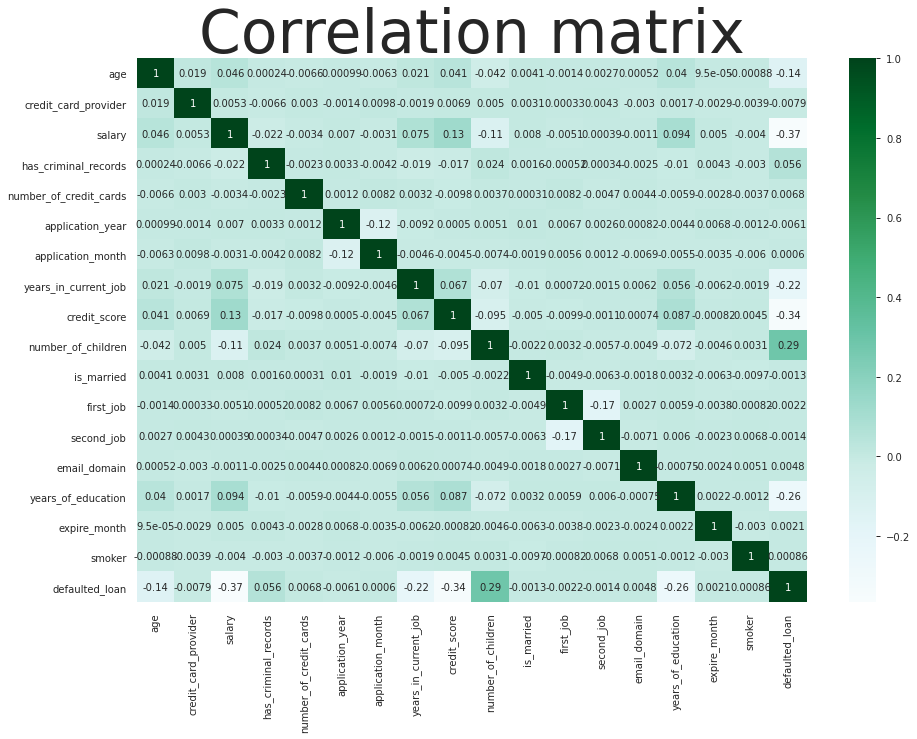

In [ ]:
corr = train_dataset.corr(method="spearman")
plt.figure(figsize=(15,10)), sns.heatmap(corr, annot = True,cmap='BuGn')
plt.title("Correlation matrix",fontdict= {'fontsize':60})
plt.savefig("correlation-matriz-datSet.png")
plt.show()

In [ ]:
rs = np.random.RandomState(0)
df = pd.DataFrame(rs.rand(20, 20))
corr = train_dataset.corr()
corr.style.background_gradient(cmap='coolwarm')

,age,credit_card_provider,salary,has_criminal_records,number_of_credit_cards,application_year,application_month,years_in_current_job,credit_score,number_of_children,is_married,first_job,second_job,email_domain,years_of_education,expire_month,smoker,defaulted_loan
age,1.000000,0.015800,0.049317,0.000051,-0.007086,0.002189,-0.006622,0.023593,0.041451,-0.045387,0.003677,-0.000028,0.003883,0.000563,0.040168,-0.001556,-0.001969,-0.143815
credit_card_provider,0.015800,1.000000,0.004950,-0.005897,0.005591,-0.002248,0.009444,-0.001309,0.005285,0.005620,0.004362,0.000065,-0.000241,-0.003124,0.002232,-0.003977,-0.002278,-0.006386
salary,0.049317,0.004950,1.000000,-0.022666,-0.002162,0.005464,-0.002881,0.073831,0.123222,-0.116730,0.006800,-0.003332,-0.008134,-0.000879,0.092813,0.005162,-0.003311,-0.358990
has_criminal_records,0.000051,-0.005897,-0.022666,1.000000,-0.003168,0.003583,-0.004163,-0.019958,-0.015310,0.023024,0.001560,-0.000793,-0.002784,-0.002486,-0.010456,0.004273,-0.002978,0.056353
number_of_credit_cards,-0.007086,0.005591,-0.002162,-0.003168,1.000000,0.001106,0.008257,-0.000100,-0.009134,0.004333,0.000593,0.008138,-0.001171,0.004147,-0.004725,-0.003448,-0.002437,0.006801
application_year,0.002189,-0.002248,0.005464,0.003583,0.001106,1.000000,-0.133891,-0.008895,0.001371,0.003944,0.010164,0.006017,-0.002755,0.000972,-0.004087,0.007034,-0.000898,-0.005525
application_month,-0.006622,0.009444,-0.002881,-0.004163,0.008257,-0.133891,1.000000,-0.003811,-0.006108,-0.006381,-0.001902,0.004665,-0.001614,-0.006943,-0.005715,-0.003533,-0.005993,0.000539
years_in_current_job,0.023593,-0.001309,0.073831,-0.019958,-0.000100,-0.008895,-0.003811,1.000000,0.063647,-0.073874,-0.009994,0.002544,0.000141,0.004983,0.055109,-0.005934,-0.001821,-0.218137
credit_score,0.041451,0.005285,0.123222,-0.015310,-0.009134,0.001371,-0.006108,0.063647,1.000000,-0.096258,-0.005042,-0.009075,0.002451,0.001964,0.084774,-0.000733,0.004706,-0.331937
number_of_children,-0.045387,0.005620,-0.116730,0.023024,0.004333,0.003944,-0.006381,-0.073874,-0.096258,1.000000,-0.002167,0.001522,-0.003010,-0.005360,-0.076557,-0.004568,0.004051,0.304995


In [ ]:
pandas_profiling.ProfileReport(train_dataset)

In [ ]:
train_dataset = train_dataset.drop(['first_job','second_job','number_of_credit_cards','is_married','smoker','email_domain','credit_card_provider','expire_month','email_domain'],axis=1)

test_dataset = test_dataset.drop(['first_job','second_job','number_of_credit_cards','is_married','smoker','email_domain','credit_card_provider','expire_month','email_domain'],axis=1)

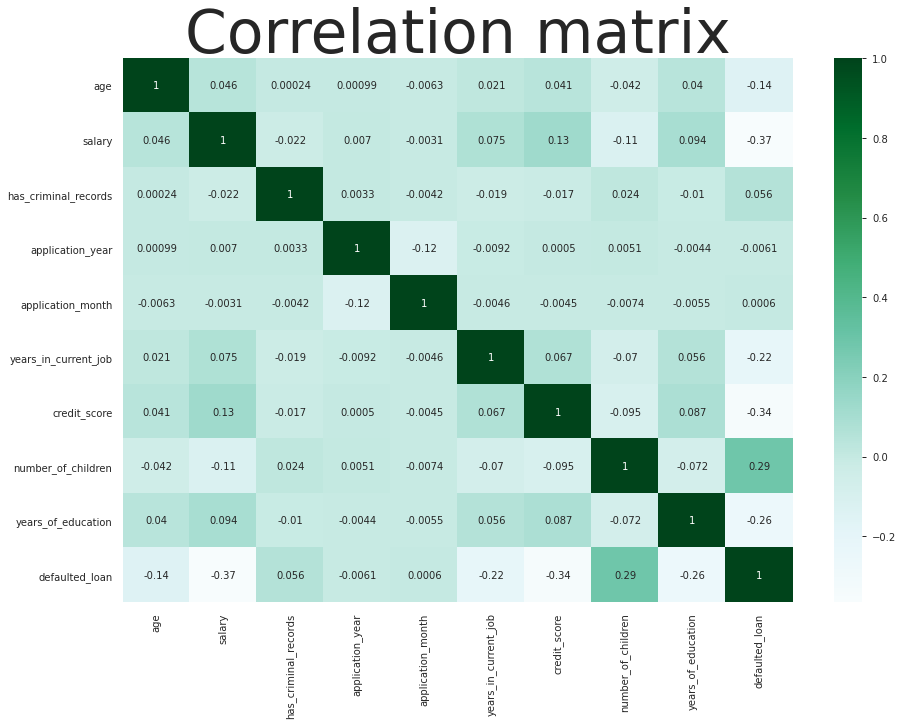

In [ ]:
corr = train_dataset.corr(method="spearman")
plt.figure(figsize=(15,10)), sns.heatmap(corr, annot = True,cmap='BuGn')
plt.title("Correlation matrix",fontdict= {'fontsize':60})
plt.savefig("correlation-matriz-datSet.png")
plt.show()

In [ ]:
train_dataset['defaulted_loan'] = train_dataset['defaulted_loan'].apply(toMapClass)
X_original_train = train_dataset.drop(['application_id','defaulted_loan'], axis=1)
y_original_train = train_dataset['defaulted_loan']
id_original_train = train_dataset['application_id']

X_original_test = test_dataset.drop(['application_id'], axis=1)
id_original_test = test_dataset['application_id']

Evaluate several models with Cross Validation

In [ ]:
# Create Decision Tree Model
desicion_tree = DecisionTreeClassifier()
skf = StratifiedKFold(n_splits=5)
scores_desicionTree = cross_val_score(desicion_tree, X_original_train, y_original_train, cv = skf, scoring="accuracy")

In [ ]:
print("Decision Tree: Accuracies with Cross Validation: ", scores_desicionTree)
print("Decision Tree: Accuracy with Cross Validation: ", scores_desicionTree.mean())

Decision Tree: Accuracies with Cross Validation:  [0.74097222 0.74166667 0.73638889 0.73902778 0.73680556]
Decision Tree: Accuracy with Cross Validation:  0.7389722222222223


In [25]:
# Create Suport Vector Machine Model
svc = SVC(kernel='rbf')
skf = StratifiedKFold(n_splits=5)
scores_svc = cross_val_score(svc, X_original_train, y_original_train, cv = skf, scoring="accuracy")

In [26]:
print("SVC: Accuracies with Cross Validation: ", scores_svc)
print("SVC: Accuracy with Cross Validation: ", scores_svc.mean())

SVC: Accuracies with Cross Validation:  [0.74972222 0.74444444 0.75       0.74666667 0.75361111]
SVC: Accuracy with Cross Validation:  0.7488888888888889


In [27]:
# Create Naive Bayes Model
naive_Bayes = GaussianNB()
skf = StratifiedKFold(n_splits=5)
scores_naive = cross_val_score(naive_Bayes, X_original_train, y_original_train, cv = skf, scoring="accuracy")
y_pred_cross = cross_val_predict(naive_Bayes,X_original_train,y_original_train,cv = skf )

In [28]:
print("Naive Bayes: Accuracies with Cross Validation: ", scores_naive)
print("Naive Bayes: Accuracy with Cross Validation: ", scores_naive.mean())

Naive Bayes: Accuracies with Cross Validation:  [0.80680556 0.81055556 0.80722222 0.80416667 0.80847222]
Naive Bayes: Accuracy with Cross Validation:  0.8074444444444445


In [29]:
X_train, X_test, y_train, y_test = train_test_split(X_original_train, y_original_train, test_size=0.3, random_state=1)
def run_model(X_train, X_test, y_train, y_test):
  skf = StratifiedKFold(n_splits=5)
  naive_Bayes = GaussianNB()
  naive_Bayes.fit(X_train, y_train)
  return naive_Bayes

def mostrar_resultados(y_test, pred_y):
  conf_matrix = confusion_matrix(y_test, pred_y)
  plt.figure(figsize=(12, 12))
  sns.heatmap(conf_matrix, annot=True, fmt="d");
  plt.title("Confusion matrix")
  plt.ylabel('True class')
  plt.xlabel('Predicted class')
  plt.show()
  print(classification_report(y_test, pred_y))

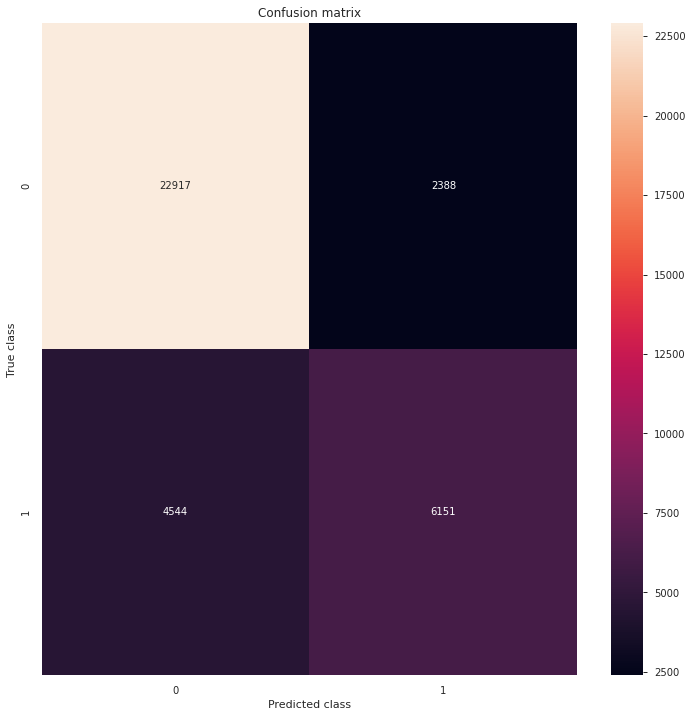

              precision    recall  f1-score   support

           0       0.83      0.91      0.87     25305
           1       0.72      0.58      0.64     10695

    accuracy                           0.81     36000
   macro avg       0.78      0.74      0.75     36000
weighted avg       0.80      0.81      0.80     36000



In [30]:
mostrar_resultados(y_original_train,y_pred_cross)

Balance

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


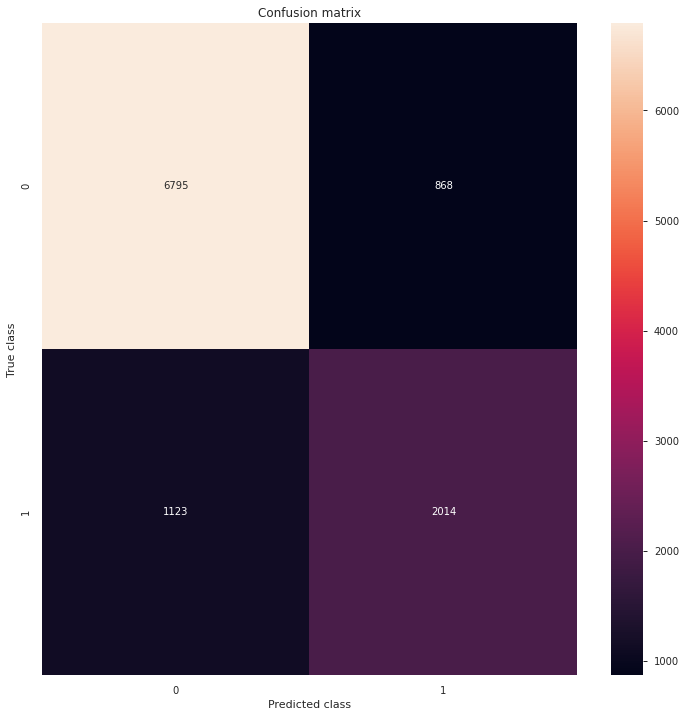

              precision    recall  f1-score   support

           0       0.86      0.89      0.87      7663
           1       0.70      0.64      0.67      3137

    accuracy                           0.82     10800
   macro avg       0.78      0.76      0.77     10800
weighted avg       0.81      0.82      0.81     10800



In [31]:
os_us = SMOTETomek(ratio=0.5)
X_train_res, y_train_res = os_us.fit_sample(X_train, y_train)
model = run_model(X_train_res, X_test, y_train_res, y_test)
pred_y = model.predict(X_test)
mostrar_resultados(y_test, pred_y)

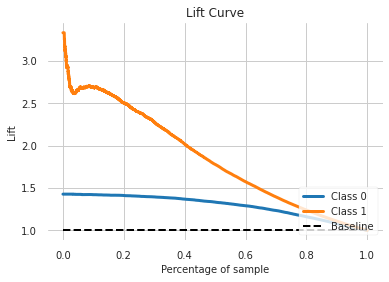

In [32]:
y_pred = model.predict_proba(X_train)
skplt.metrics.plot_lift_curve(y_train, y_pred, title='Lift Curve')
plt.show()

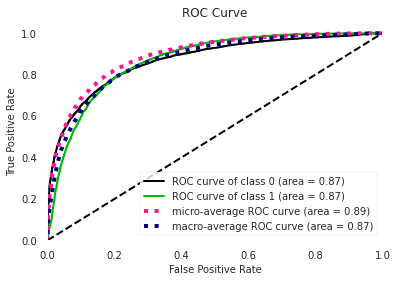

In [33]:
y_pred = model.predict_proba(X_train)
skplt.metrics.plot_roc(y_train, y_pred,title='ROC Curve')
plt.show()

Predict new data

In [34]:
y_predicted_test = model.predict(X_original_test)
id_original_test = list(id_original_test)
output = pd.DataFrame({'application_id': id_original_test, 'defaulted_loan':y_predicted_test})

Export dataset

In [35]:
output.to_csv('Hernan Cadena 02-09-2020 Proy final machine learning.csv', index=False) 
files.download('Hernan Cadena 02-09-2020 Proy final machine learning.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>